# USED CAR LEMON OR NOT

Use the "Run" button to execute the code.

In [1]:
!pip install jovian --upgrade --quiet

In [2]:
import jovian

In [3]:
# Execute this to save new versions of the notebook
jovian.commit(project="Used Car Lemon or not")

<IPython.core.display.Javascript object>

[jovian] Updating notebook "himanshu32288/used-car-lemon-or-not" on https://jovian.ai
[jovian] Committed successfully! https://jovian.ai/himanshu32288/used-car-lemon-or-not


'https://jovian.ai/himanshu32288/used-car-lemon-or-not'

In [3]:
import pandas as pd

In [4]:
train_df = pd.read_csv("./training.csv")
test_df = pd.read_csv("./test.csv")
submissions_df = pd.read_csv("./example_entry.csv")

train_df.head(5)

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,...,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,...,11597.0,12409.0,NaN,NaN,21973,33619,FL,7100.0,0,1113
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,...,11374.0,12791.0,NaN,NaN,19638,33619,FL,7600.0,0,1053
2,3,0,12/7/2009,ADESA,2005,4,DODGE,STRATUS V6,SXT,4D SEDAN SXT FFV,...,7146.0,8702.0,NaN,NaN,19638,33619,FL,4900.0,0,1389
3,4,0,12/7/2009,ADESA,2004,5,DODGE,NEON,SXT,4D SEDAN,...,4375.0,5518.0,NaN,NaN,19638,33619,FL,4100.0,0,630
4,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,...,6739.0,7911.0,NaN,NaN,19638,33619,FL,4000.0,0,1020


In [5]:
train_df.head()

,RefId,IsBadBuy,PurchDate,Auction,VehYear,VehicleAge,Make,Model,Trim,SubModel,...,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,BYRNO,VNZIP1,VNST,VehBCost,IsOnlineSale,WarrantyCost
0,1,0,12/7/2009,ADESA,2006,3,MAZDA,MAZDA3,i,4D SEDAN I,...,11597.0,12409.0,NaN,NaN,21973,33619,FL,7100.0,0,1113
1,2,0,12/7/2009,ADESA,2004,5,DODGE,1500 RAM PICKUP 2WD,ST,QUAD CAB 4.7L SLT,...,11374.0,12791.0,NaN,NaN,19638,33619,FL,7600.0,0,1053
2,3,0,12/7/2009,ADESA,2005,4,DODGE,STRATUS V6,SXT,4D SEDAN SXT FFV,...,7146.0,8702.0,NaN,NaN,19638,33619,FL,4900.0,0,1389
3,4,0,12/7/2009,ADESA,2004,5,DODGE,NEON,SXT,4D SEDAN,...,4375.0,5518.0,NaN,NaN,19638,33619,FL,4100.0,0,630
4,5,0,12/7/2009,ADESA,2005,4,FORD,FOCUS,ZX3,2D COUPE ZX3,...,6739.0,7911.0,NaN,NaN,19638,33619,FL,4000.0,0,1020


In [6]:
test_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 48707 entries, 0 to 48706
Data columns (total 33 columns):
 #   Column                             Non-Null Count  Dtype  
---  ------                             --------------  -----  
 0   RefId                              48707 non-null  int64  
 1   PurchDate                          48707 non-null  object 
 2   Auction                            48707 non-null  object 
 3   VehYear                            48707 non-null  int64  
 4   VehicleAge                         48707 non-null  int64  
 5   Make                               48707 non-null  object 
 6   Model                              48707 non-null  object 
 7   Trim                               47157 non-null  object 
 8   SubModel                           48702 non-null  object 
 9   Color                              48703 non-null  object 
 10  Transmission                       48704 non-null  object 
 11  WheelTypeID                        46519 non-null  flo

# Exploratory Data Analysis and Visualization
Before training a machine learning model, its always a good idea to explore the distributions of                      
various columns and see how they are related to the target column. Let's explore and visualize the                       
data using the Plotly, Matplotlib and Seaborn libraries. 

In [7]:
!pip install plotly matplotlib seaborn --quiet

In [8]:
import plotly.express as px
import matplotlib
import matplotlib.pyplot as plt
import seaborn as sns
%matplotlib inline

sns.set_style('darkgrid')

matplotlib.rcParams['font.size'] = 14
matplotlib.rcParams['figure.figsize'] = (10, 6)
matplotlib.rcParams['figure.facecolor'] = '#00000000'

In [9]:
px.histogram(train_df,x='IsBadBuy',title='Bad buy vs Good Buy',color='IsBadBuy')

In [10]:
px.histogram(train_df,x='Make',title='Company',color='IsBadBuy')

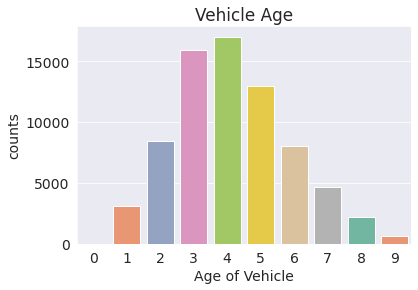

In [11]:
age=pd.DataFrame(train_df.VehicleAge.value_counts())
plt.figure(figsize=(6,4))
sns.barplot(x=age.index,y='VehicleAge',data=age,palette='Set2')
plt.ylabel('counts')
plt.xlabel('Age of Vehicle')
plt.title("Vehicle Age")
plt.show()

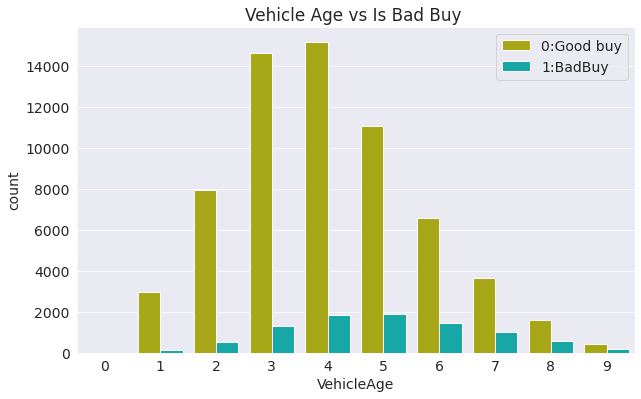

In [12]:
plt.title("Vehicle Age vs Is Bad Buy ")
sns.countplot(x = "VehicleAge", data =train_df, hue = "IsBadBuy",palette=['y','c'])
plt.legend(['0:Good buy','1:BadBuy'])
plt.show()

In [13]:
px.histogram(train_df, x = "Nationality", color = "IsBadBuy",height=450,width=800)

In [14]:
px.histogram(train_df, x = "Auction", color = "IsBadBuy",height=450,width=800)

In [15]:
px.scatter(train_df.head(5000), x = 'MMRAcquisitionAuctionAveragePrice', y = 'MMRAcquisitionRetailAveragePrice', color = 'IsBadBuy',height=500,width=1000)

In [16]:
px.scatter(train_df, x = 'MMRAcquisitionAuctionAveragePrice', y = 'MMRAcquisitionRetailAveragePrice', color = 'IsBadBuy',height=500,width=1000)

Probability of bad buys depending on country :- 
----------------------------------------------

AMERICAN	:  0.12104280002621748 
OTHER ASIAN	:  0.13208016930163077 
Top LINE ASIAN	:  0.13460505104782375 
OTHERS		:  0.13846153846153847


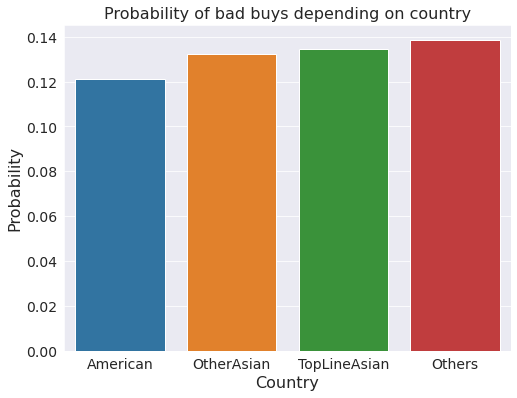

In [17]:
total=train_df.Nationality.value_counts()
american=train_df[(train_df.Nationality=='AMERICAN')&(train_df.IsBadBuy==1)].count()[1]
otherasian=train_df[(train_df.Nationality=='OTHER ASIAN')&(train_df.IsBadBuy==1)].count()[1]
topasian=train_df[(train_df.Nationality=='TOP LINE ASIAN')&(train_df.IsBadBuy==1)].count()[1]
other=train_df[(train_df.Nationality=='OTHER')&(train_df.IsBadBuy==1)].count()[1]
print("Probability of bad buys depending on country :- \n----------------------------------------------\n")
print("AMERICAN\t: ",american/total[0],
        "\nOTHER ASIAN\t: ",otherasian/total[1], 
        "\nTop LINE ASIAN\t: " ,topasian/total[2],
        "\nOTHERS\t\t: ",other/total[3])
x_titles=['American','OtherAsian','TopLineAsian','Others'];
y_titles=[american/total[0],otherasian/total[1],topasian/total[2],other/total[3]]
plt.figure(figsize=(8,6))
plt.title("Probability of bad buys depending on country",fontsize=16)
plt.ylabel('Probability',fontsize=16)
plt.xlabel('Country',fontsize=16)
sns.barplot(x=x_titles,y=y_titles);
plt.show()

In [18]:
import numpy as np

<AxesSubplot:>

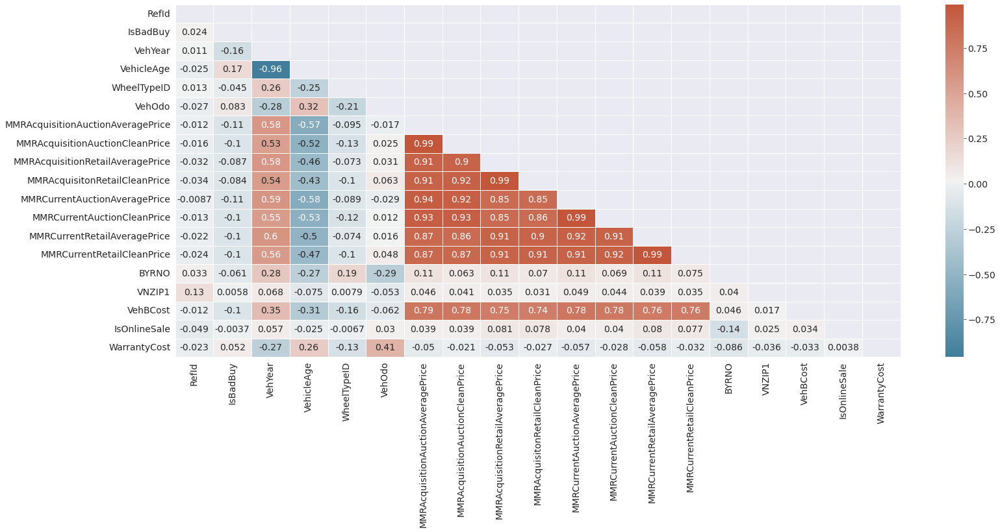

In [19]:
corr = train_df.corr()
plt.figure(figsize=(25,10))
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap,linewidths=.5,annot=True)

# Missing Values (%ages)
Let's check for the % of missing values in each column.

In [20]:
train_df.isna().sum()*100/len(train_df)

RefId                                 0.000000
IsBadBuy                              0.000000
PurchDate                             0.000000
Auction                               0.000000
VehYear                               0.000000
VehicleAge                            0.000000
Make                                  0.000000
Model                                 0.000000
Trim                                  3.233630
SubModel                              0.010961
Color                                 0.010961
Transmission                          0.012332
WheelTypeID                           4.342107
WheelType                             4.348958
VehOdo                                0.000000
Nationality                           0.006851
Size                                  0.006851
TopThreeAmericanName                  0.006851
MMRAcquisitionAuctionAveragePrice     0.024663
MMRAcquisitionAuctionCleanPrice       0.024663
MMRAcquisitionRetailAveragePrice      0.024663
MMRAcquisiton

In [38]:
print("Description about the columns of Dataset:-\n")
text_file = open('./Carvana_Data_Dictionary.txt')
file_content = text_file.read()
print(file_content)
text_file.close()

Description about the columns of Dataset:-

Field Name				Definition
RefID				        Unique (sequential) number assigned to vehicles
IsBadBuy				Identifies if the kicked vehicle was an avoidable purchase 
PurchDate				The Date the vehicle was Purchased at Auction
Auction					Auction provider at which the  vehicle was purchased
VehYear					The manufacturer's year of the vehicle
VehicleAge				The Years elapsed since the manufacturer's year
Make					Vehicle Manufacturer 
Model					Vehicle Model
Trim					Vehicle Trim Level
SubModel				Vehicle Submodel
Color					Vehicle Color
Transmission				Vehicles transmission type (Automatic, Manual)
WheelTypeID				The type id of the vehicle wheel
WheelType				The vehicle wheel type description (Alloy, Covers)
VehOdo					The vehicles odometer reading
Nationality				The Manufacturer's country
Size					The size category of the vehicle (Compact, SUV, etc.)
TopThreeAmericanName			Identifies if the manufacturer is one of the top three American manufacturers

RefId is not a useful column .\
BYRNO(Unique number assigned to the buyer that purchased the vehicle) is not useful too\
VNZIP1 (Zipcode where the car was purchased) is not useful too\
The vehicle age and VehYear bought are present thus PurchDate is not required.\

In [22]:
train_df.drop(['RefId','BYRNO','VNZIP1','PurchDate'],axis=1,inplace=True)
test_df.drop(['RefId','BYRNO','VNZIP1','PurchDate'],axis=1,inplace=True)

In [23]:
print("For Training Dataset:")
df=pd.DataFrame(train_df.isna().sum())
df.rename({0:'counts'},axis=1,inplace=True)
df[(df.counts>0)]

For Training Dataset:


,counts
Trim,2360
SubModel,8
Color,8
Transmission,9
WheelTypeID,3169
WheelType,3174
Nationality,5
Size,5
TopThreeAmericanName,5
MMRAcquisitionAuctionAveragePrice,18


 Cleaning unnacessory data

In [24]:
print("Model.value_counts:",len(train_df.Model.value_counts(dropna=False)))
print("Make.value_counts:",len(train_df.Make.value_counts(dropna=False)))
print("SubModel.value_counts:",len(train_df.SubModel.value_counts(dropna=False)))
print("Color.value_counts:",len(train_df.Color.value_counts(dropna=False)))
print("WheelType.value_counts:",len(train_df.WheelType.value_counts(dropna=False)))
print("WheelTypeID.value_counts:",len(train_df.WheelTypeID.value_counts(dropna=False)))
print("Trim.value_counts:",len(train_df.Trim.value_counts(dropna=False)))
print("TopThreeAmericanName.value_counts:",len(train_df.TopThreeAmericanName.value_counts(dropna=False)))
print("Nationality.value_counts:",len(train_df.Nationality.value_counts(dropna=False)))
print("Transmission.value_counts:",len(train_df.Transmission.value_counts(dropna=False)))
print("Size.value_counts:",len(train_df.Size.value_counts(dropna=False)))
print("AUCGUART.value_counts:",len(train_df.AUCGUART.value_counts(dropna=False)))
print("PRIMEUNIT.value_counts:",len(train_df.AUCGUART.value_counts(dropna=False)))
print("VNST.value_counts:",len(train_df.VNST.value_counts(dropna=False)))
print("IsOnlineSale.value_counts:",len(train_df.IsOnlineSale.value_counts(dropna=False)))

Model.value_counts: 1063
Make.value_counts: 33
SubModel.value_counts: 864
Color.value_counts: 17
WheelType.value_counts: 4
WheelTypeID.value_counts: 5
Trim.value_counts: 135
TopThreeAmericanName.value_counts: 5
Nationality.value_counts: 5
Transmission.value_counts: 4
Size.value_counts: 13
AUCGUART.value_counts: 3
PRIMEUNIT.value_counts: 3
VNST.value_counts: 37
IsOnlineSale.value_counts: 2


# Conclusions 
We can drop Model, Trim and SubModel as they have alot of categories and model wont be able to learn all of them.\
Note: WheelType and WheelTypeID are one and the same. One of them is containing numeric categories and other as string. Its better we drop WheelTypeID as the other column has type of metal used for making the wheel which might help us understand the importance of a particular metal used in making the wheel 

VehYear might not play a crucial role as we have VehicleAge as a column. The PurchDate varies and similarly VehYear varies.The only thing that matters is how much old the vehicle is at the time of resale. Thus drop VehYear

State from which car is bought should nit be a factor for judging bad buy . Thus we can drop VNST .

In [25]:
train_df.drop(['Model','Trim','SubModel','VehYear','WheelTypeID','VNST'],axis=1,inplace=True)
test_df.drop(['Model','Trim','SubModel','VehYear','WheelTypeID','VNST'],axis=1,inplace=True)

In [26]:
train_df.sample(5)

,IsBadBuy,Auction,VehicleAge,Make,Color,Transmission,WheelType,VehOdo,Nationality,Size,...,MMRAcquisitonRetailCleanPrice,MMRCurrentAuctionAveragePrice,MMRCurrentAuctionCleanPrice,MMRCurrentRetailAveragePrice,MMRCurrentRetailCleanPrice,PRIMEUNIT,AUCGUART,VehBCost,IsOnlineSale,WarrantyCost
50139,0,MANHEIM,4,PONTIAC,MAROON,AUTO,Alloy,79030,AMERICAN,VAN,...,7747.0,4774.0,6177.0,5656.0,7171.0,NaN,NaN,4635.0,0,4622
21939,0,OTHER,3,DODGE,GREY,AUTO,Covers,75538,AMERICAN,SPECIALTY,...,16234.0,10021.0,11714.0,14386.0,16624.0,NaN,NaN,10000.0,0,1389
27833,0,MANHEIM,6,DODGE,YELLOW,AUTO,Special,70373,AMERICAN,COMPACT,...,4147.0,2411.0,3377.0,3104.0,4147.0,NaN,NaN,4200.0,0,986
21053,0,MANHEIM,5,DODGE,SILVER,AUTO,Alloy,77321,AMERICAN,MEDIUM SUV,...,13492.0,8069.0,9897.0,11966.0,13278.0,NaN,NaN,9650.0,0,1389
38003,0,MANHEIM,6,CHEVROLET,WHITE,AUTO,Alloy,87796,AMERICAN,MEDIUM SUV,...,8280.0,5512.0,6835.0,9205.0,10687.0,NaN,NaN,8520.0,0,2452


In [27]:
targets=train_df['IsBadBuy']
train_df.drop('IsBadBuy',axis=1,inplace=True)

# DATA PREPARATION

In [28]:
categorical_cols = train_df.select_dtypes(include = 'object').columns.tolist()
numeric_cols = train_df.select_dtypes(exclude='object').columns.tolist()

In [29]:
from sklearn.impute import SimpleImputer
imputer=SimpleImputer(strategy='mean');
imputer.fit(train_df[numeric_cols]);
train_df[numeric_cols]=imputer.transform(train_df[numeric_cols]);
test_df[numeric_cols]=imputer.transform(test_df[numeric_cols]);

In [37]:
df=pd.DataFrame(train_df.isna().sum())
df.rename({0:'counts'},axis=1,inplace=True)
df[(df.counts>0)]

,counts


In [31]:
train_df.Transmission.fillna('Trans_unk',inplace=True)
train_df.WheelType.fillna('WheelType_unk',inplace=True)
train_df.Nationality.fillna('Nationality_unk',inplace=True)
train_df.Size.fillna('Trans_unk',inplace=True)
train_df.TopThreeAmericanName.fillna('TopThreeAmericanName_unk',inplace=True)
train_df.PRIMEUNIT.fillna('PRIMEUNIT_unk',inplace=True)
train_df.AUCGUART.fillna('AUCGUART_unk',inplace=True)
train_df.Color.fillna('Color_unk',inplace=True)

test_df.TopThreeAmericanName.fillna('Trans_unk',inplace=True)
test_df.Size.fillna('Trans_unk',inplace=True)
test_df.WheelType.fillna('Trans_unk',inplace=True)
test_df.Nationality.fillna('Trans_unk',inplace=True)
test_df.Transmission.fillna('Trans_unk',inplace=True)
test_df.PRIMEUNIT.fillna('PRIMEUNIT_unk',inplace=True)
test_df.AUCGUART.fillna('AUCGUART_unk',inplace=True)
test_df.Color.fillna('Color_unk',inplace=True)

In [32]:
from sklearn.preprocessing import OneHotEncoder
encoder=OneHotEncoder(sparse=False,handle_unknown='ignore')
encoder.fit(train_df[categorical_cols])
encoded_cols=list(encoder.get_feature_names_out(categorical_cols))
train_df[encoded_cols]=encoder.transform(train_df[categorical_cols]);
test_df[encoded_cols]=encoder.transform(test_df[categorical_cols]);test_df[numeric_cols]=imputer.transform(test_df[numeric_cols]);

In [33]:
from sklearn.preprocessing import MinMaxScaler
scaler=MinMaxScaler()
scaler.fit(train_df[numeric_cols]);
train_df[numeric_cols]=scaler.transform(train_df[numeric_cols])
test_df[numeric_cols]=scaler.transform(test_df[numeric_cols])

In [34]:
train_df=train_df[numeric_cols+encoded_cols]
test_df=test_df[numeric_cols+encoded_cols]

In [35]:
from sklearn.model_selection import train_test_split
inputs,val_inputs,targets,val_targets = train_test_split(train_df,targets,test_size=0.25, random_state=42)

# BASIC MODEL

In [36]:
from sklearn.metrics import accuracy_score, confusion_matrix

dum_model_outs=np.zeros(len(inputs))
accuracy_score(dum_model_outs,targets)

0.8767743939200175

# MODEL1 DECISION TREE CLASSIFIER 

In [39]:
%%time
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, confusion_matrix
model=DecisionTreeClassifier(random_state=42)
model.fit(inputs,targets)
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

Train_acc: 1.0  | Val_acc: 0.8245642880631371
CPU times: user 1.55 s, sys: 6.03 ms, total: 1.56 s
Wall time: 1.56 s


# Hyperparameter Tuning and Overfitting
As we saw in the previous section, our decision tree classifier memorized all training examples, leading to a 100% training accuracy, while the validation accuracy was only marginally better than a dumb baseline model. This phenomenon is called overfitting, and in this section, we'll look at some strategies for reducing overfitting. The process of reducing overfitting is known as regularlization.

The DecisionTreeClassifier accepts several arguments, some of which can be modified to reduce overfitting.

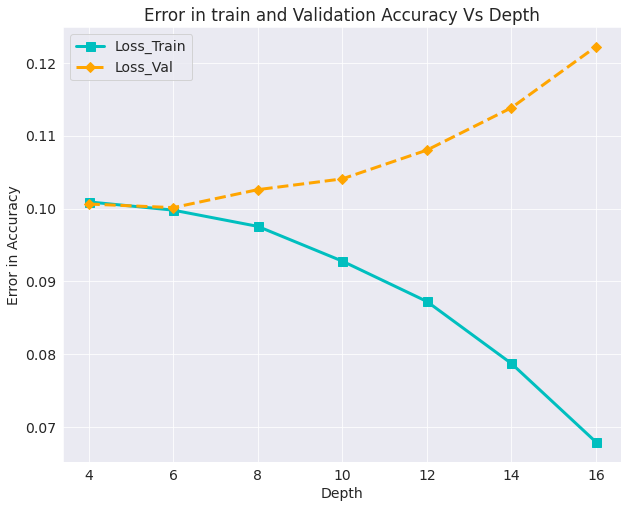

In [40]:
def max_depth(min,max):
    depth=[]
    tr_ac=[]
    va_ac=[]
    for i in range(min,max,2):
        model =DecisionTreeClassifier(max_depth=i, random_state=42)
        model.fit(inputs,targets)
        depth.append(i)
        tr_ac.append(model.score(inputs,targets))
        va_ac.append(model.score(val_inputs,val_targets))
        
    tr_ac=1-np.array(tr_ac);
    va_ac=1-np.array(va_ac);
    
    plt.figure(figsize=(10,8))
    sns.set_style('darkgrid')
    plt.title('Error in train and Validation Accuracy Vs Depth')
    plt.xlabel('Depth')
    plt.ylabel('Error in Accuracy')
    plt.plot(depth,tr_ac,'cs-',linewidth=3,markersize=9)
    plt.plot(depth,va_ac,'D--',color='orange',linewidth=3, markersize=7)
    plt.legend(['Loss_Train','Loss_Val']);
    plt.show()
max_depth(4,18)

In [41]:
model=DecisionTreeClassifier(max_depth=6,random_state=42,max_features=0.9,class_weight={0:1,1:2})
model.fit(inputs,targets)
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

Train_acc: 0.8994099055483494  | Val_acc: 0.8989367532609888


In [42]:
preds=model.predict(test_df)
submissions_df['IsBadBuy']=preds
submissions_df.to_csv('Submissions.csv',index=False)

In [43]:
from sklearn.tree import plot_tree, export_text

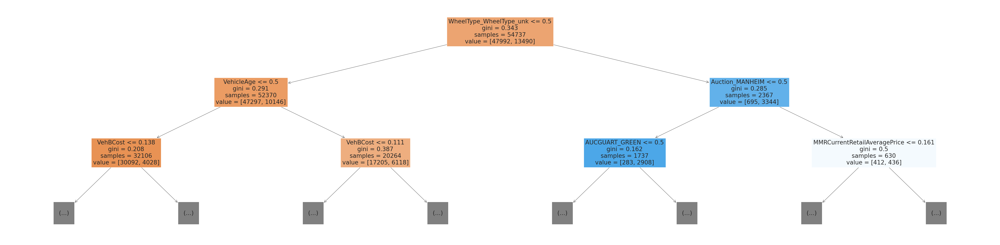

In [44]:
plt.figure(figsize=(80,20))
plot_tree(model, feature_names=train_df.columns, max_depth=2, filled=True);

In [45]:
importance_df = pd.DataFrame({
    'feature': train_df.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)

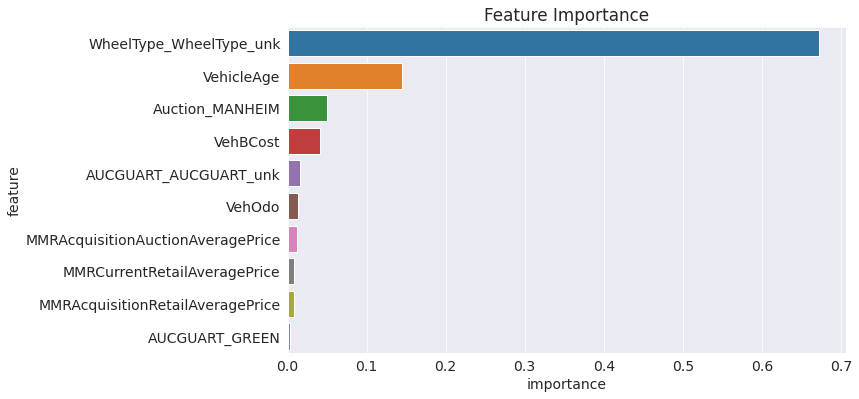

In [46]:
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10), x='importance', y='feature');

## max leaf node

In [47]:
model = DecisionTreeClassifier(max_leaf_nodes=130, random_state=42)

In [48]:
model.fit(inputs, targets)

DecisionTreeClassifier(max_leaf_nodes=130, random_state=42)

In [49]:
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

Train_acc: 0.9040502767780477  | Val_acc: 0.8981694617998466


In [50]:
model = DecisionTreeClassifier(max_leaf_nodes=100, random_state=42) 
model.fit(inputs, targets)
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

Train_acc: 0.9028810493815883  | Val_acc: 0.898059848733969


In [51]:
model = DecisionTreeClassifier(max_leaf_nodes=140, random_state=42) 
model.fit(inputs, targets)
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

Train_acc: 0.904379121983302  | Val_acc: 0.8979502356680916


# MODEL 2 
## Training a Random Forest 
While tuning the hyperparameters of a single decision tree may lead to some improvements, a much more effective strategy is to combine the results of several decision trees trained with slightly different parameters. This is called a random forest model.

In [52]:
from sklearn.ensemble import RandomForestClassifier    

In [53]:
%%time
model=RandomForestClassifier(n_jobs=-1,n_estimators=12,max_depth=16,random_state=42)
model.fit(inputs,targets)
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

Train_acc: 0.9136050569084897  | Val_acc: 0.8984434944645402
CPU times: user 1.57 s, sys: 12.4 ms, total: 1.58 s
Wall time: 822 ms


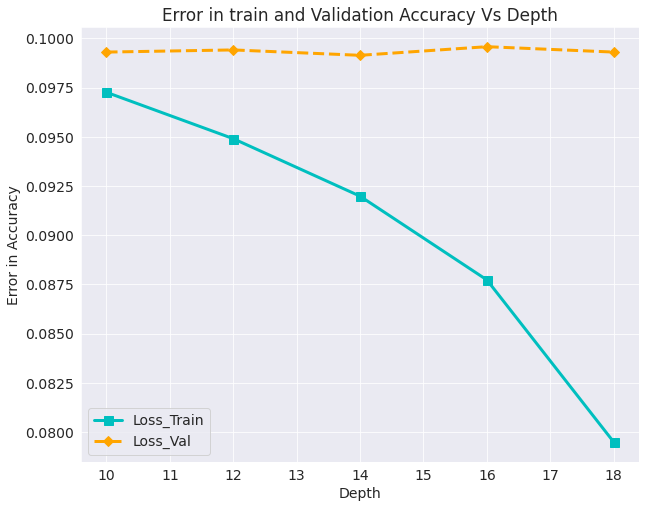

In [54]:
def max_depth(min,max):
    depth=[]
    tr_ac=[]
    va_ac=[]
    for i in range(min,max,2):
        model =RandomForestClassifier(max_depth=i, random_state=42)
        model.fit(inputs,targets)
        depth.append(i)
        tr_ac.append(model.score(inputs,targets))
        va_ac.append(model.score(val_inputs,val_targets))
        
    tr_ac=1-np.array(tr_ac);
    va_ac=1-np.array(va_ac);
    
    plt.figure(figsize=(10,8))
    sns.set_style('darkgrid')
    plt.title('Error in train and Validation Accuracy Vs Depth')
    plt.xlabel('Depth')
    plt.ylabel('Error in Accuracy')
    plt.plot(depth,tr_ac,'cs-',linewidth=3,markersize=9)
    plt.plot(depth,va_ac,'D--',color='orange',linewidth=3, markersize=7)
    plt.legend(['Loss_Train','Loss_Val']);
    plt.show()
max_depth(10,20)

In [55]:
def test_model(**params):
        model=RandomForestClassifier(n_jobs=-1,random_state=42,**params)
        model.fit(inputs,targets)
        print(" | Train_acc: ",model.score(inputs,targets)," | Val_acc: ",model.score(val_inputs,val_targets) ) 
        return model.score(inputs,targets),model.score(val_inputs,val_targets)

In [ ]:
jovian.commit()

<IPython.core.display.Javascript object>

In [ ]:
test_model(n_estimators=12)
test_model(n_estimators=100)

In [ ]:
%%time
model=RandomForestClassifier(n_jobs=-1,n_estimators=100,max_depth=16,random_state=42)
model.fit(inputs,targets)
print("Train_acc:",model.score(inputs,targets)," | Val_acc:",model.score(val_inputs,val_targets))

In [ ]:
importance_df = pd.DataFrame({
    'feature': inputs.columns,
    'importance': model.feature_importances_
}).sort_values('importance', ascending=False)
importance_df.head(10)

In [ ]:
plt.figure(figsize=(10,6))
plt.title('Feature Importance')
sns.barplot(data=importance_df.head(10),palette='husl',x='importance', y='feature');
plt.show()

In [ ]:
preds=model.predict_proba(test_df)
submissions_df['IsBadBuy']=preds[:,1]
submissions_df.to_csv('Submissions.csv',index=False)

## SUMMARY

1.Dumb model accuracy =87% \
2.Decision tree has max accuracy on val is close to 89% \
3.Random forest with max depth 16 and n estimators giving us best accuracy 

In [ ]:
jovian.commit();